# How to Train Detectron2 on Custom Objects

This tutorial implements the new [Detectron2 Library](https://ai.facebook.com/blog/-detectron2-a-pytorch-based-modular-object-detection-library-/) by facebook. This notebook shows training on **your own custom objects** for object detection.

It is worth noting that the Detectron2 library goes far beyond object detection, supporting semantic segmentation, keypoint detection, mask, and densepose.


### Accompanying Blog Post

We recommend that you follow along in this notebook while reading the blog post on [how to train Detectron2](https://blog.roboflow.ai/how-to-train-detectron2/), concurrently.

### Steps Covered in this Tutorial

In this tutorial, we will walk through the steps required to train Detectron2 on your custom objects. We use a [public blood cell detection dataset](https://public.roboflow.ai/object-detection/bccd), which is open source and free to use. You can also use this notebook on your own data.

To train our detector we take the following steps:

* Install Detectron2 dependencies
* Download custom Detectron2 object detection data
* Visualize Detectron2 training data
* Write our Detectron2 Training configuration
* Run Detectron2 training
* Evaluate Detectron2 performance
* Run Detectron2 inference on test images



### **About**

[Roboflow](https://roboflow.ai) enables teams to deploy custom computer vision models quickly and accurately. Convert data from to annotation format, assess dataset health, preprocess, augment, and more. It's free for your first 1000 source images.

#### ![Roboflow Workmark](https://i.imgur.com/WHFqYSJ.png)

# Install Detectron2 Dependencies

In [7]:
# install dependencies: (use cu101 because colab has CUDA 10.1)
#!pip install -U torch==1.5 torchvision==0.6 -f https://download.pytorch.org/whl/cu101/torch_stable.html 
#!pip install cython pyyaml==5.1
#!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
#import torch, torchvision
#print(torch.__version__, torch.cuda.is_available())
#!gcc --version
#!nvcc --version
# opencv is pre-installed on colab

!python -m pip install pyyaml==5.1
import sys, os, distutils.core
# Note: This is a faster way to install detectron2 in Colab, but it does not include all functionalities.
# See https://detectron2.readthedocs.io/tutorials/install.html for full installation instructions
!git clone 'https://github.com/facebookresearch/detectron2'
dist = distutils.core.run_setup("./detectron2/setup.py")
!python -m pip install {' '.join([f"'{x}'" for x in dist.install_requires])}
sys.path.insert(0, os.path.abspath('./detectron2'))

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Cloning into 'detectron2'...
remote: Enumerating objects: 15038, done.
remote: Counting objects: 100% (63/63), done.
remote: Compressing objects: 100% (40/40), done.
remote: Total 15038 (delta 29), reused 48 (delta 23), pack-reused 14975
Receiving objects: 100% (15038/15038), 6.12 MiB | 21.02 MiB/s, done.
Resolving deltas: 100% (10892/10892), done.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 5.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 8.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 17.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [4]:
# install detectron2:
!pip install detectron2==0.1.3 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html
ERROR: Could not find a version that satisfies the requirement detectron2==0.1.3 (from versions: none)
ERROR: No matching distribution found for detectron2==0.1.3


In [8]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2022 NVIDIA Corporation
Built on Wed_Sep_21_10:33:58_PDT_2022
Cuda compilation tools, release 11.8, V11.8.89
Build cuda_11.8.r11.8/compiler.31833905_0
torch:  2.0 ; cuda:  cu118
detectron2: 0.6


In [9]:
# You may need to restart your runtime prior to this, to let your installation take effect
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2.data.catalog import DatasetCatalog

# Import and Register Custom Detectron2 Data

In [11]:
!curl -L "https://app.roboflow.com/ds/6somd3Mh8m?key=l06b3oF5Cf" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip


  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   892  100   892    0     0    397      0  0:00:02  0:00:02 --:--:--   397
100 3564k  100 3564k    0     0  1490k      0  0:00:02  0:00:02 --:--:-- 1490k
Archive:  roboflow.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
   creating: test/
 extracting: test/IMG_20230426_212155_BURST10_jpg.rf.bfb8128f0869b00d76cc437de84bffd8.jpg  
 extracting: test/IMG_20230426_212155_BURST11_jpg.rf.722fcedc23b9e6793621be9d076b1a90.jpg  
 extracting: test/IMG_20230426_212155_BURST14_jpg.rf.41462df4c5306afc566c1d38042c1102.jpg  
 extracting: test/IMG_20230426_212155_BURST16_jpg.rf.356d3bd101c1bead17d5f90826db3f4e.jpg  
 extracting: test/IMG_20230426_212208_11_jpg.rf.0b81d7c27ba1e37650d379ab072d0388.jpg  
 extracting: test/IMG_20230426_212208_14_jpg.rf.32335a4cfa0aca54aa4f45a00e38af89.jpg  
 extracting: test/IMG_20

In [12]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train", {}, "/content/train/_annotations.coco.json", "/content/train")
register_coco_instances("my_dataset_val", {}, "/content/valid/_annotations.coco.json", "/content/valid")
register_coco_instances("my_dataset_test", {}, "/content/test/_annotations.coco.json", "/content/test")


WARNING [05/12 16:30:57 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[05/12 16:30:57 d2.data.datasets.coco]: Loaded 77 images in COCO format from /content/train/_annotations.coco.json


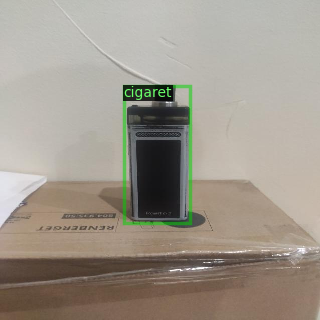

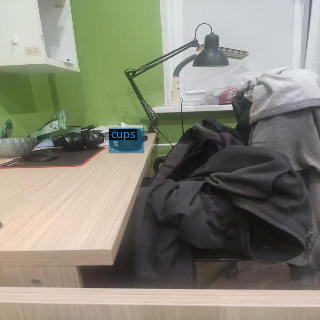

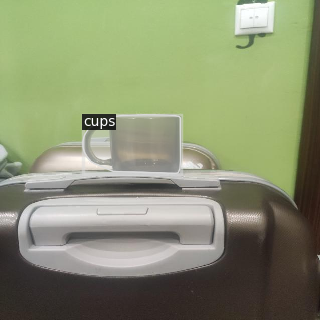

In [13]:
#visualize training data
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train")
dataset_dicts = DatasetCatalog.get("my_dataset_train")

import random
from detectron2.utils.visualizer import Visualizer

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

# Train Custom Detectron2 Detector

In [14]:
#We are importing our own Trainer Module here to use the COCO validation evaluation during training. Otherwise no validation eval occurs.

from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator

class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

In [18]:
#from .detectron2.tools.train_net import Trainer
#from detectron2.engine import DefaultTrainer
# select from modelzoo here: https://github.com/facebookresearch/detectron2/blob/master/MODEL_ZOO.md#coco-object-detection-baselines

from detectron2.config import get_cfg
#from detectron2.evaluation.coco_evaluation import COCOEvaluator
import os

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ("my_dataset_val",)

cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.001


cfg.SOLVER.WARMUP_ITERS = 1000
cfg.SOLVER.MAX_ITER = 2000 #adjust up if val mAP is still rising, adjust down if overfit
cfg.SOLVER.STEPS = (1000, 1500)
cfg.SOLVER.GAMMA = 0.05




cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2 #your number of classes + 1

cfg.TEST.EVAL_PERIOD = 500


os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CocoTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[05/12 16:35:19 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_68b088.pkl: 421MB [00:01, 210MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[05/12 16:35:22 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.10/dist-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[05/12 16:36:17 d2.utils.events]:  eta: 1:13:26  iter: 19  total_loss: 1.597  loss_cls: 1.212  loss_box_reg: 0.3219  loss_rpn_cls: 0.005172  loss_rpn_loc: 0.001981    time: 2.2535  last_time: 2.5183  data_time: 0.0398  last_data_time: 0.0088   lr: 1.931e-06  max_mem: 7268M
[05/12 16:37:13 d2.utils.events]:  eta: 1:19:35  iter: 39  total_loss: 1.508  loss_cls: 1.158  loss_box_reg: 0.2863  loss_rpn_cls: 0.00596  loss_rpn_loc: 0.001973    time: 2.4528  last_time: 2.6518  data_time: 0.0248  last_data_time: 0.0314   lr: 2.911e-06  max_mem: 7268M
[05/12 16:38:01 d2.utils.events]:  eta: 1:18:14  iter: 59  total_loss: 1.464  loss_cls: 1.083  loss_box_reg: 0.3657  loss_rpn_cls: 0.004  loss_rpn_loc: 0.00177    time: 2.4445  last_time: 2.5961  data_time: 0.0232  last_data_time: 0.0122   lr: 3.891e-06  max_mem: 7268M
[05/12 16:38:51 d2.utils.events]:  eta: 1:17:19  iter: 79  total_loss: 1.497  loss_cls: 0.9798  loss_box_reg: 0.4063  loss_rpn_cls: 0.005506  loss_rpn_loc: 0.002561    time: 2.4493  l

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:561: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[05/12 16:56:11 d2.evaluation.evaluator]: Inference done 11/18. Dataloading: 0.0013 s/iter. Inference: 0.1904 s/iter. Eval: 0.0003 s/iter. Total: 0.1921 s/iter. ETA=0:00:01
[05/12 16:56:13 d2.evaluation.evaluator]: Total inference time: 0:00:02.626375 (0.202029 s / iter per device, on 1 devices)
[05/12 16:56:13 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:02 (0.189763 s / iter per device, on 1 devices)
[05/12 16:56:13 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[05/12 16:56:13 d2.evaluation.coco_evaluation]: Saving results to coco_eval/coco_instances_results.json
[05/12 16:56:13 d2.evaluation.coco_evaluation]: Evaluating predictions with official COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.02s).
Accumulating evaluation results...
DONE (t=0.01s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:561: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[05/12 17:16:44 d2.evaluation.evaluator]: Inference done 11/18. Dataloading: 0.0059 s/iter. Inference: 0.1914 s/iter. Eval: 0.0003 s/iter. Total: 0.1976 s/iter. ETA=0:00:01
[05/12 17:16:45 d2.evaluation.evaluator]: Total inference time: 0:00:02.648681 (0.203745 s / iter per device, on 1 devices)
[05/12 17:16:45 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:02 (0.190115 s / iter per device, on 1 devices)
[05/12 17:16:46 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[05/12 17:16:46 d2.evaluation.coco_evaluation]: Saving results to coco_eval/coco_instances_results.json
[05/12 17:16:46 d2.evaluation.coco_evaluation]: Evaluating predictions with official COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.01s).
Accumulating evaluation results...
DONE (t=0.01s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:561: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[05/12 17:37:12 d2.evaluation.evaluator]: Inference done 11/18. Dataloading: 0.0023 s/iter. Inference: 0.1889 s/iter. Eval: 0.0002 s/iter. Total: 0.1915 s/iter. ETA=0:00:01
[05/12 17:37:14 d2.evaluation.evaluator]: Total inference time: 0:00:02.621329 (0.201641 s / iter per device, on 1 devices)
[05/12 17:37:14 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:02 (0.189026 s / iter per device, on 1 devices)
[05/12 17:37:14 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[05/12 17:37:14 d2.evaluation.coco_evaluation]: Saving results to coco_eval/coco_instances_results.json
[05/12 17:37:14 d2.evaluation.coco_evaluation]: Evaluating predictions with official COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.01s).
Accumulating evaluation results...
DONE (t=0.01s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:561: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[05/12 17:57:49 d2.evaluation.evaluator]: Inference done 11/18. Dataloading: 0.0012 s/iter. Inference: 0.1880 s/iter. Eval: 0.0002 s/iter. Total: 0.1893 s/iter. ETA=0:00:01
[05/12 17:57:50 d2.evaluation.evaluator]: Total inference time: 0:00:02.605935 (0.200457 s / iter per device, on 1 devices)
[05/12 17:57:50 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:02 (0.188295 s / iter per device, on 1 devices)
[05/12 17:57:50 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[05/12 17:57:50 d2.evaluation.coco_evaluation]: Saving results to coco_eval/coco_instances_results.json
[05/12 17:57:50 d2.evaluation.coco_evaluation]: Evaluating predictions with official COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.01s).
Accumulating evaluation results...
DONE (t=0.01s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 

In [19]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [20]:
#test evaluation
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.85
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("my_dataset_test", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "my_dataset_test")
inference_on_dataset(trainer.model, val_loader, evaluator)

[05/12 18:41:51 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...
[05/12 18:41:52 d2.evaluation.coco_evaluation]: Fast COCO eval is not built. Falling back to official COCO eval.
WARNING [05/12 18:41:52 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [05/12 18:41:52 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[05/12 18:41:52 d2.data.datasets.coco]: Loaded 23 images in COCO format from /content/test/_annotations.coco.json
[05/12 18:41:52 d2.data.build]: Distribution of instances among all 3 categories:
|   category    | #instances   |  category  | #instances   |  category  | #instances   |
|:-------------:|:-------------|:----------:|:-------------|:----------:|:-------------|
| cups-cigare.. | 0            |  cigaret   | 8            |    cups    | 15          

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:561: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


[05/12 18:41:55 d2.evaluation.evaluator]: Inference done 11/23. Dataloading: 0.0061 s/iter. Inference: 0.1850 s/iter. Eval: 0.0002 s/iter. Total: 0.1914 s/iter. ETA=0:00:02
[05/12 18:41:57 d2.evaluation.evaluator]: Total inference time: 0:00:03.563037 (0.197947 s / iter per device, on 1 devices)
[05/12 18:41:57 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:03 (0.185235 s / iter per device, on 1 devices)
[05/12 18:41:57 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[05/12 18:41:57 d2.evaluation.coco_evaluation]: Saving results to ./output/coco_instances_results.json
[05/12 18:41:57 d2.evaluation.coco_evaluation]: Evaluating predictions with official COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=0.01s).
Accumulating evaluation results...
DONE (t=0.01s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0

OrderedDict([('bbox',
              {'AP': 40.0,
               'AP50': 50.0,
               'AP75': 50.0,
               'APs': nan,
               'APm': 0.0,
               'APl': 40.0,
               'AP-cups-cigaretts': nan,
               'AP-cigaret': 80.0,
               'AP-cups': 0.0})])

# Inference with Detectron2 Saved Weights



In [21]:
%ls ./output/

NotImplementedError: ignored

In [22]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.DATASETS.TEST = ("my_dataset_test", )
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set the testing threshold for this model
predictor = DefaultPredictor(cfg)
test_metadata = MetadataCatalog.get("my_dataset_test")

[05/12 18:42:17 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


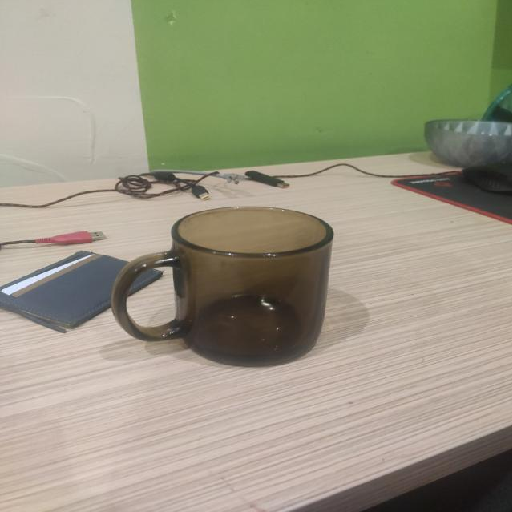

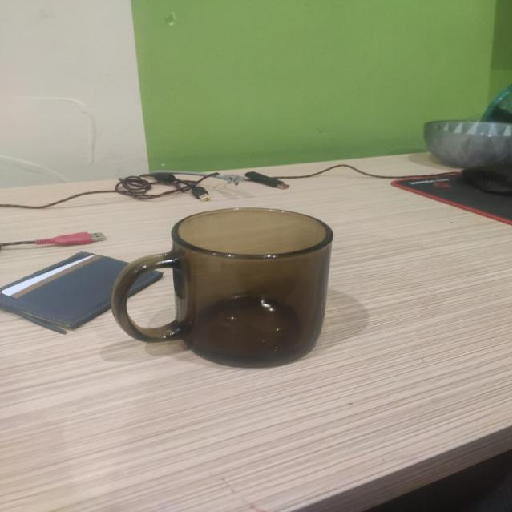

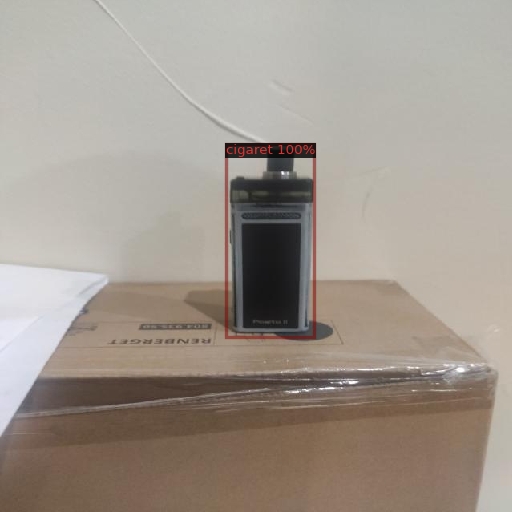

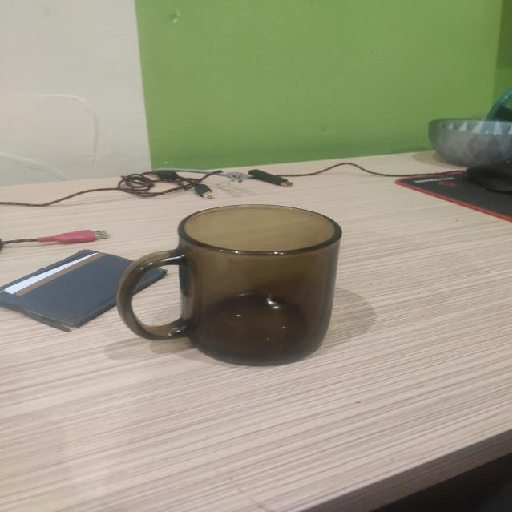

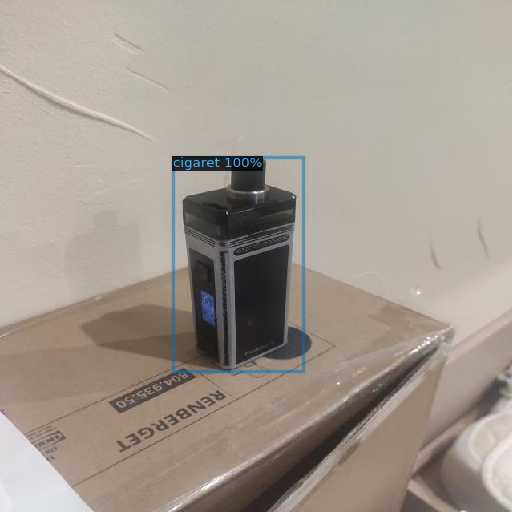

...

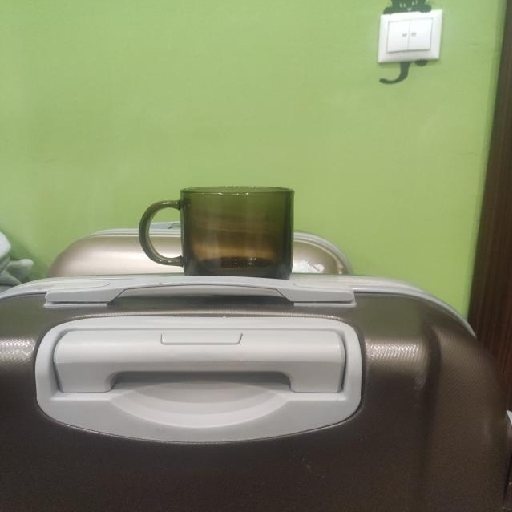

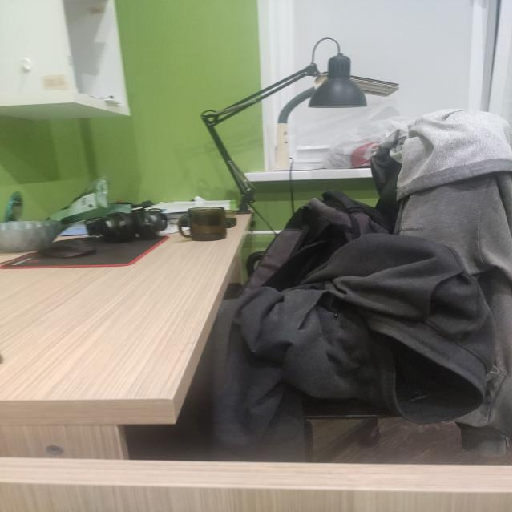

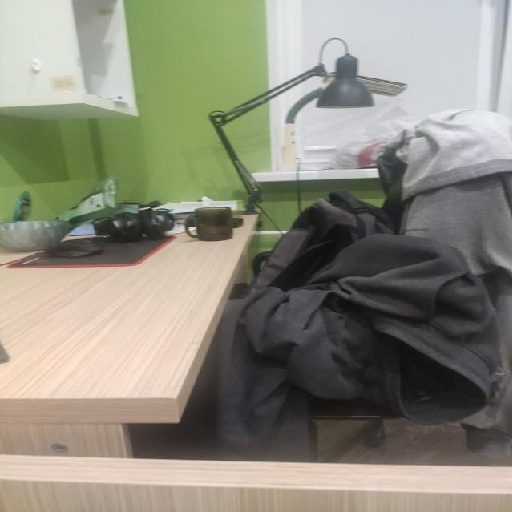

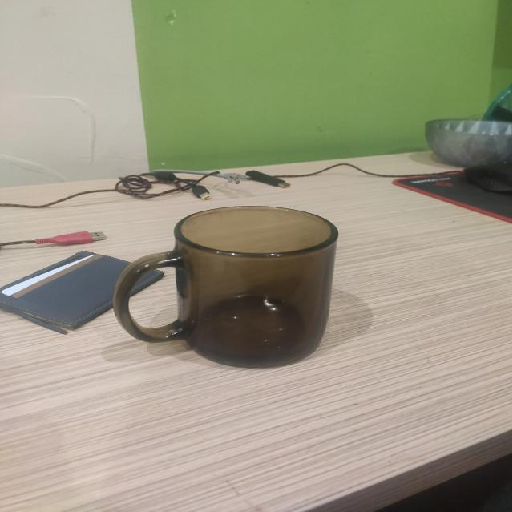

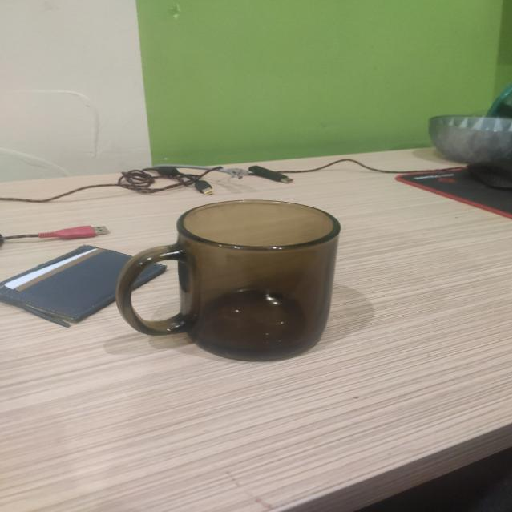

In [23]:
from detectron2.utils.visualizer import ColorMode
import glob

for imageName in glob.glob('/content/test/*jpg'):
  im = cv2.imread(imageName)
  outputs = predictor(im)
  v = Visualizer(im[:, :, ::-1],
                metadata=test_metadata, 
                scale=0.8
                 )
  out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2_imshow(out.get_image()[:, :, ::-1])
